In [ ]:
import cv2
import matplotlib.pyplot as plt
import numpy as np
import matplotlib
# Tells notebook to render figures in-page.
%matplotlib inline
from IPython.display import Image

###Reading, Displaying, Saving Images

width: 1280
height: 720


True

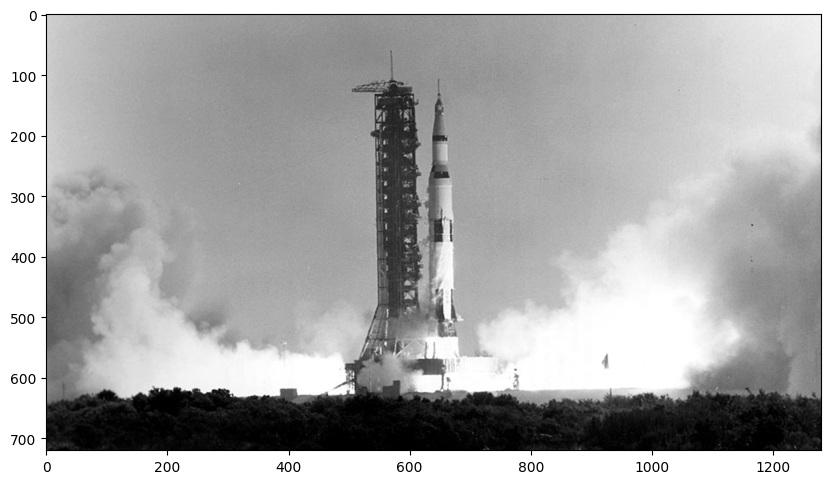

In [ ]:
# Read the image ('Apollo-11-launch.jpg') using OpenCV imread() as a grayscale image.
apollo = cv2.imread("Apollo-11-launch.jpg", cv2.IMREAD_GRAYSCALE)


# Print the image width and height.
print("width: " + str(apollo.shape[1]))
print("height: " + str(apollo.shape[0]))


# Display the image using matplotlib imshow().
plt.figure(figsize = [10, 10])
plt.imshow(apollo, cmap = "gray")


# Save the image as a PNG file using OpenCV imwrite().
cv2.imwrite('First Exercise.png', apollo)

### Basic Image Manipulations


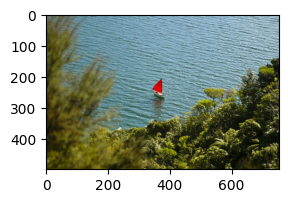

In [ ]:
# Read the image 'New_Zealand_Boat.jpg' using OpenCV imread() as a color image.
new_zealand = cv2.imread('New_Zealand_Boat.jpg', cv2.IMREAD_COLOR)
plt.figure(figsize=[3,3])
plt.imshow(new_zealand[:, :, ::-1]);

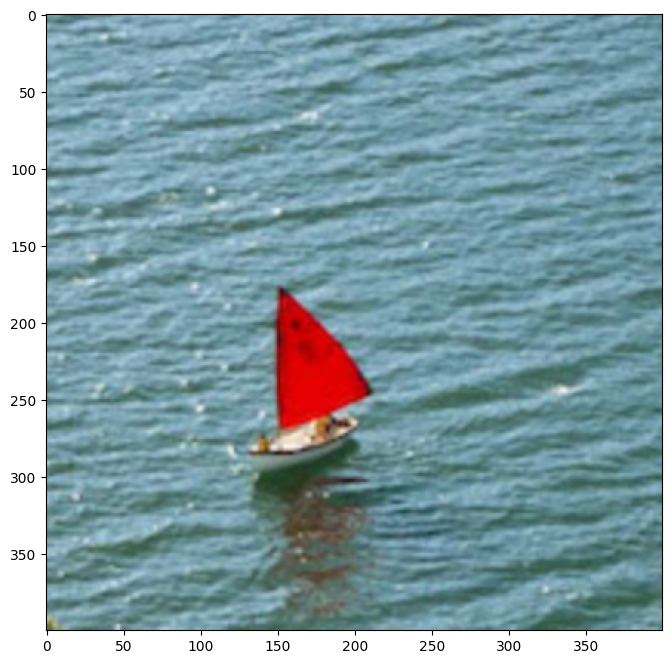

In [ ]:
# Crop the image to extract the region around the sale boat.
cropped_img = new_zealand[120:320, 250:450]

# Resize the image up by a factor of 2x.
resized_2x = cv2.resize(cropped_img, None, fx = 2, fy = 2)

# Flip the cropped/resized image horizontally.
flip_horizontal = cv2.flip(resized_2x, 1)

# Display the final result.
plt.figure(figsize = (8,8))
plt.imshow(flip_horizontal[:, :, ::-1]);

###Convolution and Image Filtering

In [ ]:
# Load 'butterfly.jpg' image
butterfly = cv2.imread("butterfly.jpg")

# Create a 3x3 kernel as:
# [1 2 1
#  2 4 2
#  1 2 1]
kernel_size = 3
kernel = np.array([[1, 2, 1], [2, 4, 2], [1, 2, 1]])

# Normalize the kernel to 1 and print its values
kernel_normalized = kernel/np.sum(kernel)
print(kernel_normalized)


[[0.0625 0.125  0.0625]
 [0.125  0.25   0.125 ]
 [0.0625 0.125  0.0625]]


Text(0.5, 1.0, 'Convolution Image')

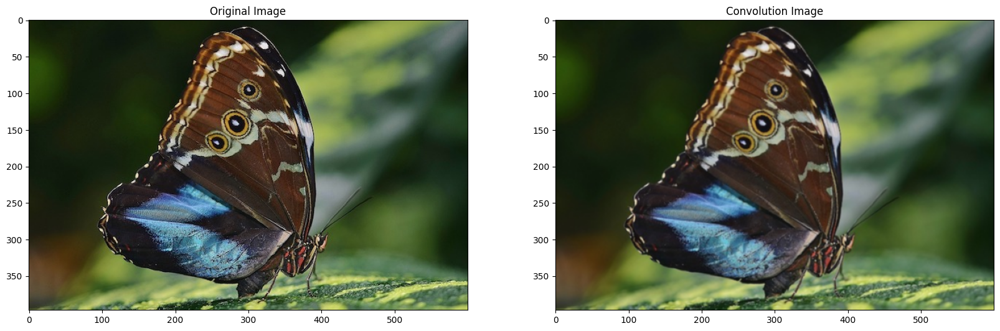

In [ ]:
# Filter the image using the created kernel
filtered_image = cv2.filter2D(butterfly, ddepth = -1, kernel = kernel_normalized)

# Plot the original and filtered image on the same row using subplot
plt.figure(figsize = [20,10])

# Original
plt.subplot(121)
plt.imshow(butterfly[:,:,::-1])
plt.title("Original Image")

# Filtered
plt.subplot(122)
plt.imshow(filtered_image[:,:,::-1])
plt.title("Convolution Image")

What is the function of this filter?

Ans: The cv2.filter2D function can be used for many image processing tasks such as blurring, sharpening, edge detection, etc. depending on the values in the kernel. In this case, it performs a blurring task.

Text(0.5, 1.0, 'Box Filtered Image')

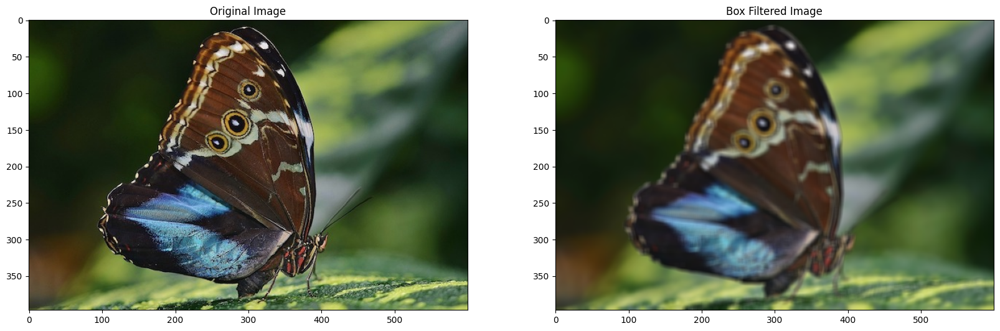

In [ ]:
# Apply a box filter with the kernel size of 7 to the original image.
box_filter = cv2.blur(butterfly, (7,7))

# Display it together with the original image
plt.figure(figsize = [20,10])

# Original
plt.subplot(121)
plt.imshow(butterfly[:,:,::-1])
plt.title("Original Image")

# Filtered
plt.subplot(122)
plt.imshow(box_filter[:,:,::-1])
plt.title("Box Filtered Image")


Text(0.5, 1.0, 'Gaussian Blur with Sigma = 3')

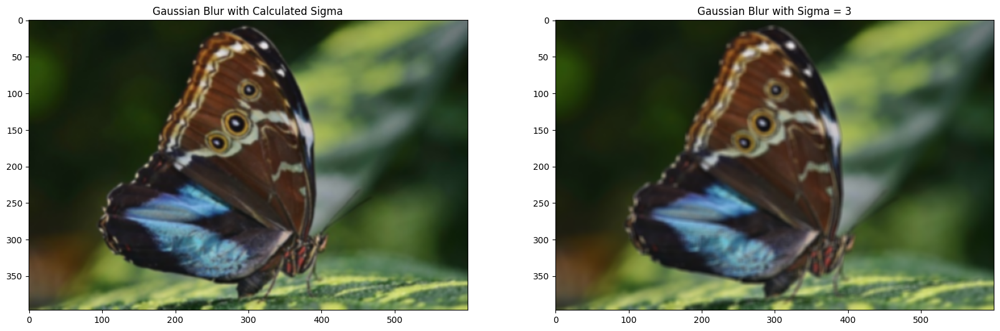

In [ ]:
# Apply Gaussian blur with the kernal size of 7x7 and the sigma being calculated automatically
gaussian_blur_auto = cv2.GaussianBlur(butterfly, (7,7), 0, 0)

# Apply Gaussian blur with the kernal size of 7x7 and sigma = 3
gaussian_blur_3 = cv2.GaussianBlur(butterfly, (7,7), 3, 3)

# Display the two blurred images
plt.figure(figsize = [20,10])

# Calculated sigma
plt.subplot(121)
plt.imshow(gaussian_blur_auto[:,:,::-1])
plt.title("Gaussian Blur with Calculated Sigma")

# Filtered
plt.subplot(122)
plt.imshow(gaussian_blur_3[:,:,::-1])
plt.title("Gaussian Blur with Sigma = 3")

Text(0.5, 1.0, 'Subtracted Image')

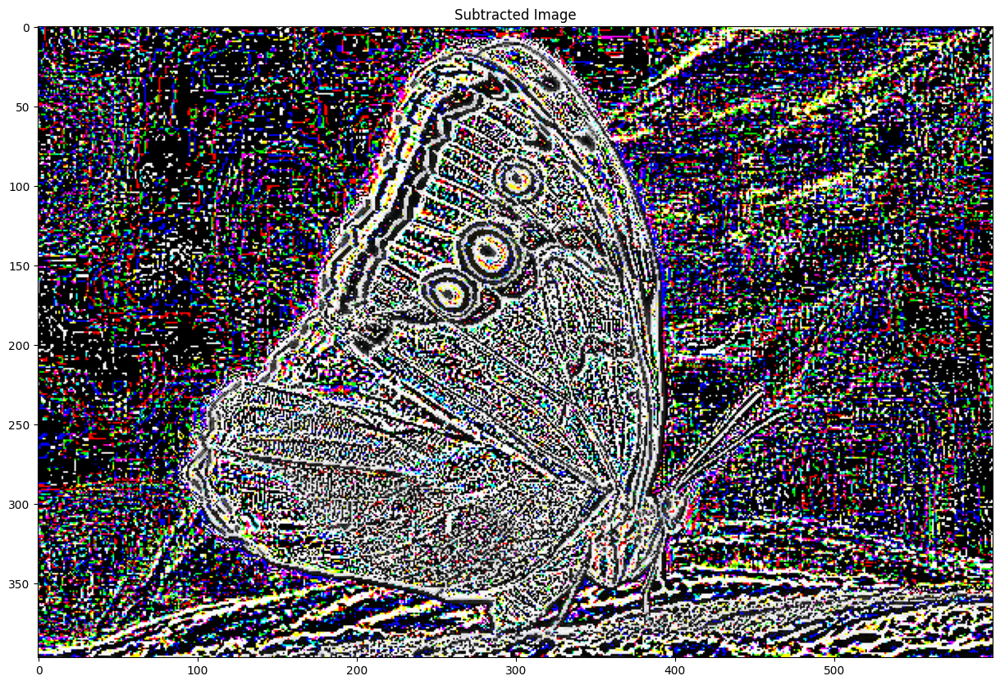

In [ ]:
# Subtract the original image by the blurred image and display it
subtracted_image = butterfly - gaussian_blur_auto
plt.figure(figsize = [20,10])
plt.imshow(subtracted_image[:,:,::-1])
plt.title("Subtracted Image")

Text(0.5, 1.0, 'Sharpened Image')

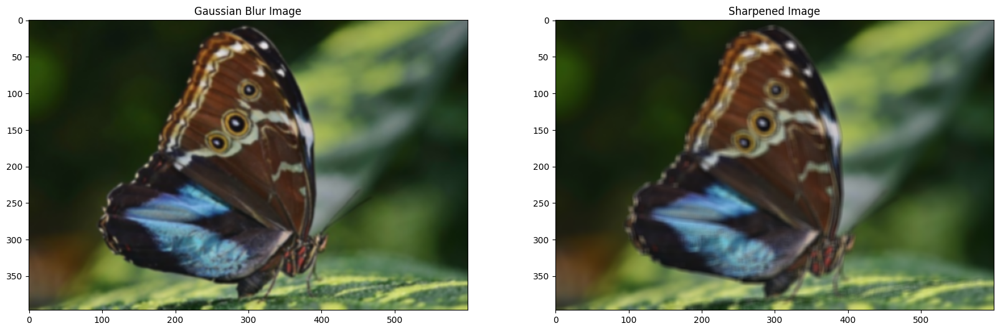

In [ ]:
# Define a kernel to sharpen the Gaussian blurred image
kernel_sharpen = np.random.randint(-1, 5, size=(3, 3))

# Filter the Gaussian blurred image with this filter
sharpen_image = cv2.filter2D(gaussian_blur_auto, ddepth = -1, kernel = kernel_sharpen)

# Plot the Gaussian blurred image and new image
plt.figure(figsize = [20,10])

# Gaussian Blur Image
plt.subplot(121)
plt.imshow(gaussian_blur_auto[:,:,::-1])
plt.title("Gaussian Blur Image")

# New Sharpened Image
plt.subplot(122)
plt.imshow(box_filter[:,:,::-1])
plt.title("Sharpened Image")

### Artistic Image Filters using OpenCV

In [ ]:
# Load the image
beautiful_lizard = cv2.imread("Large_Scaled_Forest_Lizard.jpg")

Text(0.5, 1.0, 'Sepia / Vintage Filtered Image')

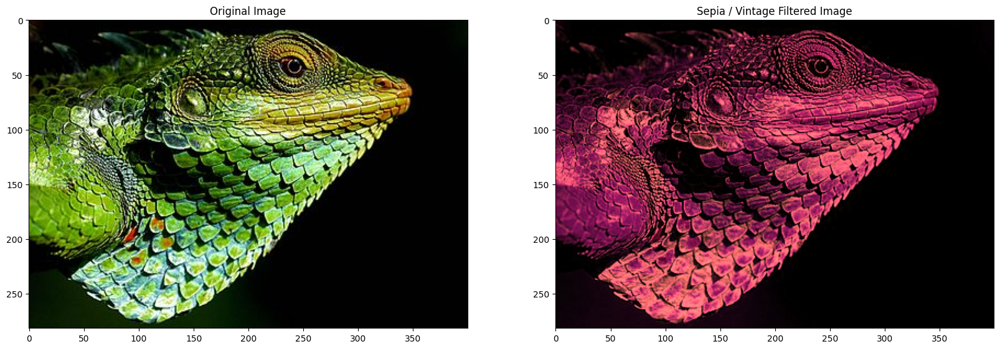

In [ ]:
# Apply the Sepia / Vintage Filter
def sepia(img):
    img_sepia = img.copy()

    # Converting to RGB as sepia matrix below is for RGB.
    img_sepia = cv2.cvtColor(img_sepia, cv2.COLOR_BGR2RGB)
    img_sepia = np.array(img_sepia, dtype = np.float64)
    kernel_sepia = np.random.rand(3, 3)
    img_sepia = cv2.transform(img_sepia, kernel_sepia)

    # Clip values to the range [0, 255].
    img_sepia = np.clip(img_sepia, 0, 255)
    img_sepia = np.array(img_sepia, dtype = np.uint8)
    img_sepia = cv2.cvtColor(img_sepia, cv2.COLOR_RGB2BGR)
    return img_sepia

lizard_sepia = sepia(beautiful_lizard)

# Display it together with the original image
plt.figure(figsize = [20,10])

# Original
plt.subplot(121)
plt.imshow(beautiful_lizard[:,:,::-1])
plt.title("Original Image")

# Filtered
plt.subplot(122)
plt.imshow(lizard_sepia[:,:,::-1])
plt.title("Sepia / Vintage Filtered Image")

Text(0.5, 1.0, 'Vignette Filtered Image')

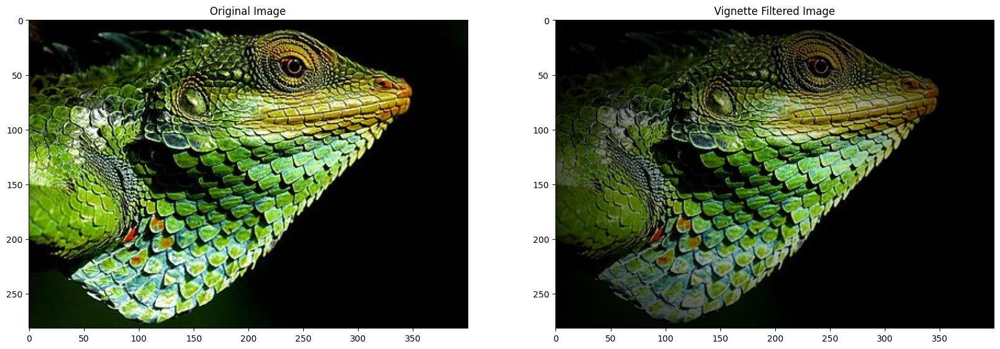

In [ ]:
# Create the Vignette Effect
def vignette(img, level = 3):

    height, width = img.shape[:2]

    # Generate vignette mask using Gaussian kernels.
    X_resultant_kernel = cv2.getGaussianKernel(width, width/level)
    Y_resultant_kernel = cv2.getGaussianKernel(height, height/level)

    # Generating resultant_kernel matrix.
    # H x 1 * 1 x W
    kernel = Y_resultant_kernel * X_resultant_kernel.T
    mask = kernel / kernel.max()

    img_vignette = np.copy(img)

    # Applying the mask to each channel in the input image.
    for i in range(3):
        img_vignette[:,:,i] = img_vignette[:,:,i] * mask

    return img_vignette

lizard_vignette = vignette(beautiful_lizard)

# Display it together with the original image
plt.figure(figsize = [20,10])

# Original
plt.subplot(121)
plt.imshow(beautiful_lizard[:,:,::-1])
plt.title("Original Image")

# Filtered
plt.subplot(122)
plt.imshow(lizard_vignette[:,:,::-1])
plt.title("Vignette Filtered Image")

Text(0.5, 1.0, 'Constrast Image')

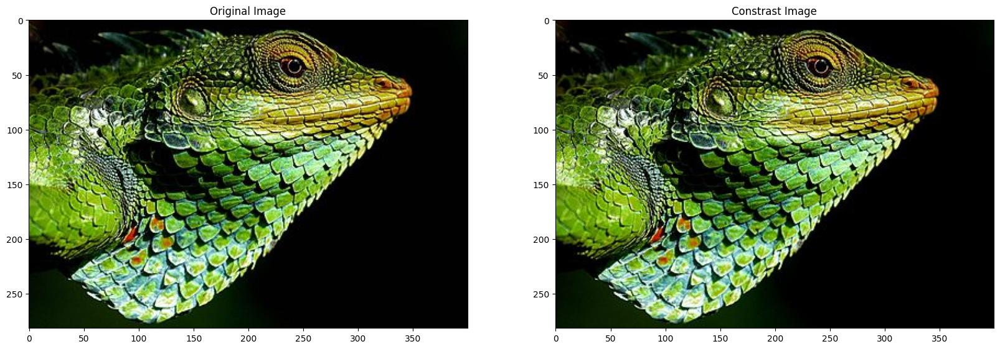

In [ ]:
# Increase the constrast
def contrast(img, level):
    img_bright = cv2.convertScaleAbs(img, alpha = level)
    return img_bright

lizard_contrast = vignette(beautiful_lizard, 0.3)

# Display it together with the original image
plt.figure(figsize = [20,10])

# Original
plt.subplot(121)
plt.imshow(beautiful_lizard[:,:,::-1])
plt.title("Original Image")

# Filtered
plt.subplot(122)
plt.imshow(lizard_contrast[:,:,::-1])
plt.title("Constrast Image")

Text(0.5, 1.0, 'Outlined Image')

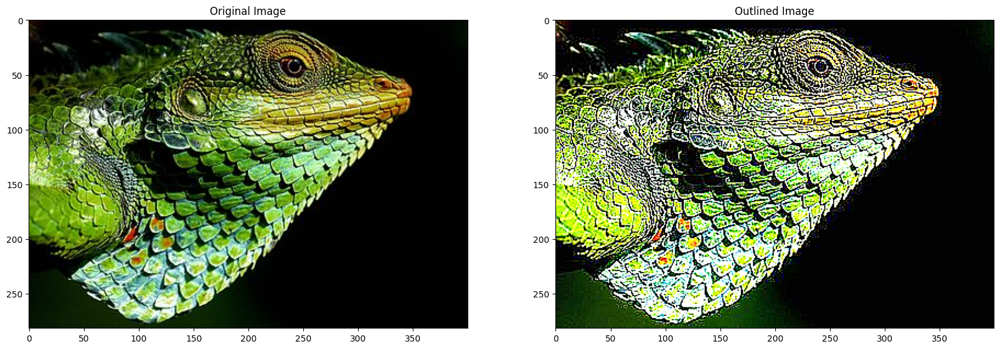

In [ ]:
# Apply the outline Filter
def outline(img, k = 9):

    k = max(k,9)
    kernel = np.array([[-1, -1, -1],
                       [-1,  k, -1],
                       [-1, -1, -1]])

    img_outline = cv2.filter2D(img, ddepth = -1, kernel = kernel)

    return img_outline

lizard_outline = outline(beautiful_lizard, 10)

# Display it together with the original image
plt.figure(figsize = [20,10])

# Original
plt.subplot(121)
plt.imshow(beautiful_lizard[:,:,::-1])
plt.title("Original Image")

# Filtered
plt.subplot(122)
plt.imshow(lizard_outline[:,:,::-1])
plt.title("Outlined Image")

Text(0.5, 1.0, 'Outlined Image')

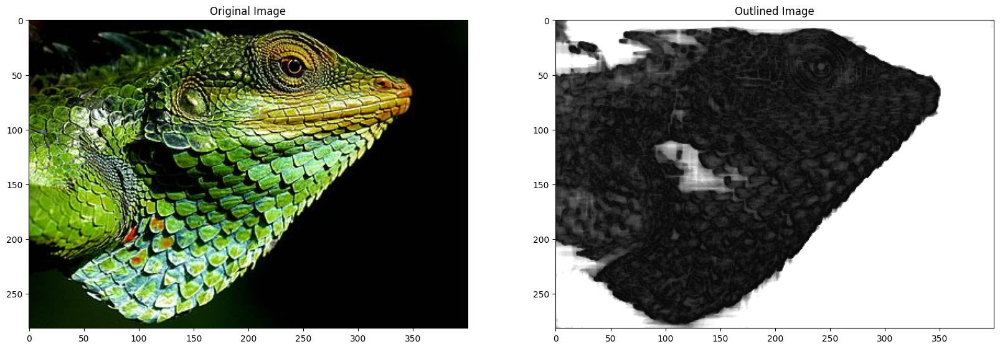

In [ ]:
# Apply the Pencil Sketch Filter
lizard_blur = cv2.GaussianBlur(beautiful_lizard, (5,5), 0, 0)
lizard_pencil, _ = cv2.pencilSketch(lizard_blur)

# Display it together with the original image
plt.figure(figsize = [20,10])

# Original
plt.subplot(121)
plt.imshow(cv2.cvtColor(beautiful_lizard, cv2.COLOR_BGR2RGB))
plt.title("Original Image")

# Filtered
plt.subplot(122)
plt.imshow(cv2.cvtColor(lizard_pencil, cv2.COLOR_BGR2RGB))
plt.title("Outlined Image")